In [1]:
# purpose: preprocess and test spatiotemporal classifiers for subject

In [12]:
# purpose: test a given classifier from prettymouth_fmriprep2/saved_classifiers

# specify parameters used for classifier

maskType = 1
removeAvg = 1
filterType = 0
k1 = 0
k2 = 25
constant_classifier = 0
if constant_classifier:
    TR_to_use = 15 + 378  #index begins at 378
    
# one set with masktype = 1: 1, 1, 0, 0, 50 (c1/2), [1 1 0 0 25]
# masktype = 0: 0, 1, 1, 0, 100 (c2)

In [13]:
import logging
logging.basicConfig(level=logging.DEBUG, format='%(levelname)s:%(asctime)s - %(message)s')
import numpy as np
import pickle
import nibabel as nib
import nilearn
from nilearn.image import resample_to_img
import matplotlib.pyplot as plt
from nilearn import plotting
from nilearn.plotting import show
from nilearn.plotting import plot_roi
from nilearn import image
from nilearn.masking import apply_mask
# get_ipython().magic('matplotlib inline')
import scipy
import matplotlib
import matplotlib.pyplot as plt
from nilearn import image
from nilearn.input_data import NiftiMasker
#from nilearn import plotting
import nibabel
from nilearn.masking import apply_mask
from nilearn.image import load_img
from nilearn.image import new_img_like
import numpy as np
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import datasets, svm, metrics
from sklearn.linear_model import Ridge
from sklearn.svm import SVC, LinearSVC
from sklearn.cross_validation import KFold
from sklearn.cross_validation import LeaveOneLabelOut
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.multiclass import OneVsRestClassifier
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import StratifiedKFold
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.feature_selection import SelectFwe
from scipy import signal
from scipy.fftpack import fft, fftshift
from scipy import interp
import csv
params = {'legend.fontsize': 'large',
          'figure.figsize': (5, 3),
          'axes.labelsize': 'x-large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'x-large',
          'ytick.labelsize': 'x-large'}
font = {'weight': 'bold',
        'size': 22}
plt.rc('font', **font)
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectPercentile, f_classif, GenericUnivariateSelect, SelectKBest, chi2
from sklearn.feature_selection import RFE
import os
import seaborn as sns
import pandas as pd
import csv
from scipy import stats
import brainiak
import brainiak.funcalign.srm
import sys
from sklearn.utils import shuffle
import random
from datetime import datetime
random.seed(datetime.now())

In [14]:
# first get that subject's data ready for preprocessing in the same way
projectDir = '/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes/'
fmriprep_dir=projectDir + '/derivatives/fmriprep'
preproc_dir = projectDir + '/derivatives/preproc'
TOM_large = '/jukebox/norman/amennen/prettymouth_fmriprep2/ROI/TOM_large_resampled_maskedbybrain.nii.gz'
TOM_cluster = '/jukebox/norman/amennen/prettymouth_fmriprep2/ROI/TOM_cluster_resampled_maskedbybrain.nii.gz'
fmriprep2_path = '/jukebox/norman/amennen/prettymouth_fmriprep2/code'
offline_path = '/jukebox/norman/amennen/prettymouth_fmriprep2/code/saved_classifiers'
DMNmask='/jukebox/norman/amennen/MNI_things/Yeo_JNeurophysiol11_MNI152/Yeo_Network7mask_reoriented_resampledBOLD2.nii.gz'


In [15]:
# steps:
# -- 1. load in data, mask properly
# -- 2. (if needed) truncate and filter
# -- 3. otherwise, just load and mask -- this cell
subjectNum=101
allSubjects = [101,102]
nSub = len(allSubjects)

story_TR_1 = 14
story_TR_2 = 464
run_TRs = 450
nRuns = 4 # for subject 101 nRuns = 3, for subject 102 nRuns = 4


zscore_data = 1
if maskType == 0:
    nVoxels = 3757
elif maskType == 1:
    nVoxels = 2414
allData = np.zeros((nVoxels,run_TRs,nRuns,nSub))
originalData_all = np.zeros((nVoxels,run_TRs,nRuns,nSub))
zscoredData_all = np.zeros((nVoxels,run_TRs,nRuns,nSub))
removedAvgData_all = np.zeros((nVoxels,run_TRs,nRuns,nSub))


In [16]:
# get all subject data first
for s in np.arange(nSub):
    subjectNum = allSubjects[s]
    bids_id = 'sub-{0:03d}'.format(subjectNum)
    ses_id = 'ses-{0:02d}'.format(1)
    data_dir = fmriprep_dir + '/' + bids_id + '/' + ses_id + '/' + 'func'

    if subjectNum == 101:
        nRuns = 3
    else:
        nRuns = 4
    
    for r in np.arange(nRuns):
        subjectRun = r + 1
        run_id = 'run-{0:02d}'.format(subjectRun)
        subjData = data_dir + '/' + bids_id + '_' + ses_id + '_' + 'task-story' + '_' + run_id + '_' + 'space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz'
        print(subjData)
        if filterType == 0:
            if maskType == 0:
                masked_data = apply_mask(subjData,DMNmask)
            elif maskType == 1:
                masked_data = apply_mask(subjData,TOM_large)
            elif maskType == 2:
                masked_data = apply_mask(subjData,TOM_cluster)
            masked_data_remove10 = masked_data[10:,:]
            originalData_all[:,:,r,s] = masked_data_remove10[story_TR_1:story_TR_2,:].T # now should be voxels x TR
        # now go through same process if filtering
        if filterType > 0:
            n_trunc = 12
            # first take off those 12 time points in the beginning
            # only do this one time
            output_name = data_dir + '/' + bids_id + '_' + ses_id + '_' + 'task-story' + '_' + run_id + '_' + 'space-MNI152NLin2009cAsym_desc-preproc_bold_truncTRs.nii.gz'
            if not os.path.isfile(output_name):
                epi_data = nib.load(subjData)
                epi=epi_data.get_fdata()
                epi_trunc =np.zeros((epi_data.shape[0], epi_data.shape[1], epi_data.shape[2], epi_data.shape[3]-n_trunc))
                epi_trunc[:, :, :, :] = epi[:,:,:,n_trunc:]
                #print(epi_data.shape, '  ', epi_trunc.shape)
                dimsize=epi_data.header.get_zooms()
                #print(dimsize)
                affine_mat = epi_data.affine  # What is the orientation of the data
                #print(affine_mat)
                # now save
                bold_nii = nib.Nifti1Image(epi_trunc, affine_mat)
                hdr = bold_nii.header  # get a handle for the .nii file's header
                hdr.set_zooms((dimsize[0], dimsize[1], dimsize[2], epi_trunc.shape[3]))
                if not os.path.exists(os.path.dirname(output_name)):
                    os.makedirs(os.path.dirname(output_name))
                nib.save(bold_nii, output_name)
            if filterType == 1:
                filterTHRESH = 337.75
            elif filterType == 2:
                filterTHRESH = 140
            if maskType == 0:
                epi_masker = NiftiMasker(mask_img = DMNmask,
                         high_pass=1/filterTHRESH,
                         standardize=False,
                         t_r=1.5,
                         memory='nilearn_cache',
                         memory_level=1,
                         verbose=0
                        )
            elif maskType == 1:
                epi_masker = NiftiMasker(mask_img = TOM_large,
                         high_pass=1/filterTHRESH,
                         standardize=False,
                         t_r=1.5,
                         memory='nilearn_cache',
                         memory_level=1,
                         verbose=0
                        )
            elif maskType == 2:
                epi_masker = NiftiMasker(mask_img = TOM_cluster,
                         high_pass=1/filterTHRESH,
                         standardize=False,
                         t_r=1.5,
                         memory='nilearn_cache',
                         memory_level=1,
                         verbose=0
                        )
            epi_mask_data = epi_masker.fit_transform(output_name)
            originalData_all[:,:,r,s] = epi_mask_data[story_TR_1-2:story_TR_2-2,:].T
            # A. get story TRs ONLY
        # B. zscore within that subject across all time points
        if zscore_data:
            originalData_all[:,:,r,s] = stats.zscore(originalData_all[:,:,r,s],axis=1,ddof = 1)
            originalData_all[:,:,r,s] = np.nan_to_num(originalData_all[:,:,r,s])
            zscoredData_all[:,:,r,s] = originalData_all[:,:,r,s]
        # C. remove average signal
        if removeAvg:
            average_signal_fn = offline_path + '/' +  'averageSignal' + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '.npy'
            average_signal = np.load(average_signal_fn)
            #average_signal = 0
            SRM_removed = originalData_all[:,:,r,s] - average_signal
            removedAvgData_all[:,:,r,s] = SRM_removed
        else:
            removedAvgData_all[:,:,r,s] = originalData_all[:,:,r,s]
        allData[:,:,r,s] = removedAvgData_all[:,:,r,s]

/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-101/ses-01/func/sub-101_ses-01_task-story_run-01_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-101/ses-01/func/sub-101_ses-01_task-story_run-02_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-101/ses-01/func/sub-101_ses-01_task-story_run-03_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-102/ses-01/func/sub-102_ses-01_task-story_run-01_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-102/ses-01/func/sub-102_ses-01_task-story_run-02_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-102/ses-01/func/sub-102_ses-01_task-story_run-03_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-102/ses-01/func/sub-102_ses-01_task-story_run-04_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


101
[28 29]
***
[64 65 66 67 68 69 70 71 72 73 74]
***
[114 115 116 117 118 119]
***
[180 181 182 183 184 185]
***
[285 286 287]
***
[306 307 308 309 310]
***
[348 349 350 351 352 353 354]
***
[379 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396
 397 398 399 400 401 402 403 404 405]
***
[431 432 433 434 435 436 437 438]
***
0 0
[28 29]
***
[64 65 66 67 68 69 70 71 72 73 74]
***
[114 115 116 117 118 119]
***
[180 181 182 183 184 185]
***
[285 286 287]
***
[306 307 308 309 310]
***
[348 349 350 351 352 353 354]
***
[379 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396
 397 398 399 400 401 402 403 404 405]
***
[431 432 433 434 435 436 437 438]
***
1 0
[28 29]
***
[64 65 66 67 68 69 70 71 72 73 74]
***
[114 115 116 117 118 119]
***
[180 181 182 183 184 185]
***
[285 286 287]
***
[306 307 308 309 310]
***
[348 349 350 351 352 353 354]
***
[379 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396
 397 398 399 400 401 402 403 404 405]
***


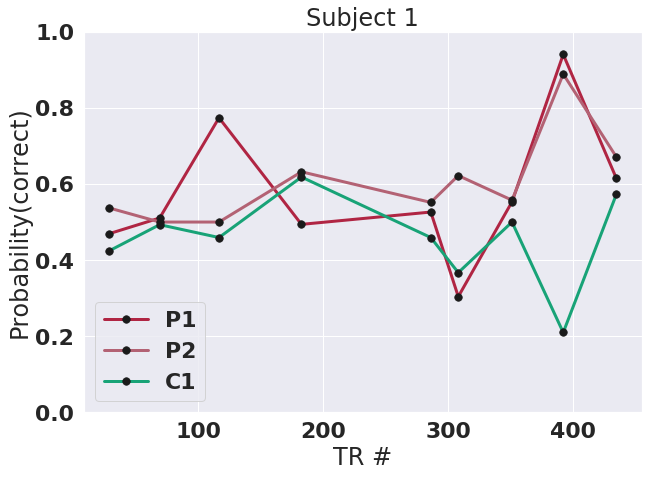

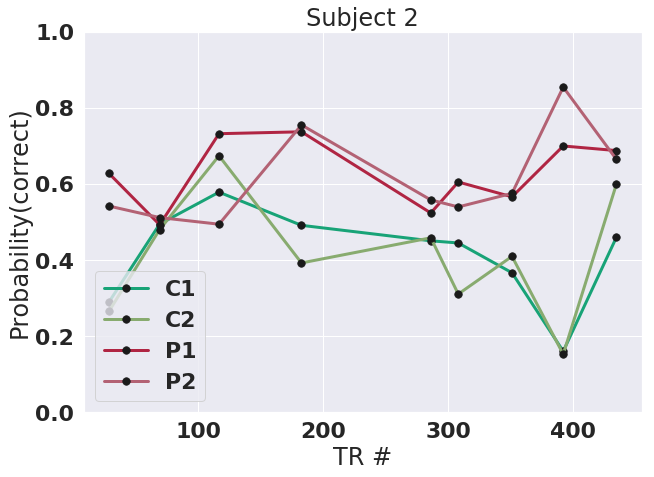

In [20]:
# load station information
# THIS IS DOING IT THE ORIGINAL WAY FROM THE FIRST STATIONS BUT I DON'T KNOW WHY I ADDED THE LAST COUPLE OF STATIONS!
stationsDict = np.load('/jukebox/norman/amennen/prettymouth_fmriprep2/code/upper_right_winners_nofilter.npy').item()
nStations = len(stationsDict)

nTRs = run_TRs
nRuns = 4
correct_prob = np.zeros((nStations,nRuns,nSub))
# load spatiotemporal pattern and test for each separate station
runOrder = {}
runOrder[0] = ['P', 'P', 'C']
runOrder[1] = ['C', 'C', 'P', 'P']
for s in np.arange(nSub):
    subjectNumber = allSubjects[s]
    print(subjectNumber)
    if subjectNumber == 101:
        nRuns = 3
    else:
        nRuns = 4
    for r in np.arange(nRuns):
        for st in np.arange(nStations):
            stationInd = st
            #filename = offline_path + '/' + 'MEGA2_stationInd_' + str(stationInd) + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg)  + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2)  + '.sav'
            filename = offline_path + '/' + 'UPPERRIGHT_stationInd_' + str(stationInd) + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg)  + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2)  + '.sav'

            loaded_model = pickle.load(open(filename, 'rb'))
            # test whole spatiotemporal pattern
            this_station_TRs = np.array(stationsDict[stationInd])
            print(this_station_TRs)
            print('***')
            n_station_TRs = len(this_station_TRs)
            testing_data = allData[:,this_station_TRs,r,s]
            testing_data_reshaped = np.reshape(testing_data,(1,nVoxels*n_station_TRs))
            cheating_probability = loaded_model.predict_proba(testing_data_reshaped)[0][1]
            if runOrder[s][r] == 'C':
                correct_prob[st,r,s] = cheating_probability
            elif runOrder[s][r] == 'P':
                correct_prob[st,r,s] = 1 - cheating_probability
        print(r,s)




stationsDict
m_tr_station = np.zeros((nStations,))
for i in np.arange(nStations):
    st = i
    m_tr_station[i] = np.mean(stationsDict[st])

sns.set(style="white")
sns.set(font_scale=2)
plt.figure(figsize=(10,7))
g1 = '#18a377'
g2 = '#88ab6f'
p1 = '#b02543'
p2 = '#b36274'
colors = [p1, p2, g1]
plt.plot(figsize=(10,7))
for r in np.arange(3):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,0],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('P1', 'P2', 'C1', 'ERR'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 1')
plt.ylim([0,1])

plt.figure(figsize=(10,7))
colors = [g1, g2, p1, p2]
plt.plot(figsize=(10,7))
for r in np.arange(4):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,1],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('C1', 'C2', 'P1', 'P2'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 2')
plt.ylim([0,1])

#np.mean(cheating_prob[:,0:2,0])
print(np.mean(correct_prob[:,0:3,0]))
print(np.mean(correct_prob[:,:,1]))

In [19]:
np.shape(testing_data_reshaped)

(1, 4828)

In [9]:
print(np.mean(correct_prob[:,0:3,0]))
print(np.mean(correct_prob[:,:,1]))

0.5463055045502513
0.5180247454922244


In [30]:
len(good_stations)

10

101
[20 21 22 23 24]
***
[64 65 66 67 68]
***
[121 122 123 124]
***
[158 159]
***
[230 231 232 233]
***
[285 286 287 288 289 290 291]
***
[315 316 317]
***
[340 341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356]
***
[380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401]
***
[413 414]
***
0 0
[20 21 22 23 24]
***
[64 65 66 67 68]
***
[121 122 123 124]
***
[158 159]
***
[230 231 232 233]
***
[285 286 287 288 289 290 291]
***
[315 316 317]
***
[340 341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356]
***
[380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401]
***
[413 414]
***
1 0
[20 21 22 23 24]
***
[64 65 66 67 68]
***
[121 122 123 124]
***
[158 159]
***
[230 231 232 233]
***
[285 286 287 288 289 290 291]
***
[315 316 317]
***
[340 341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356]
***
[380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401]
*

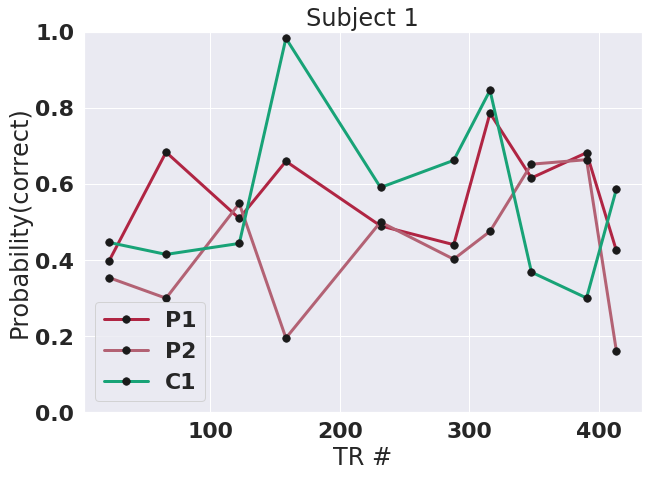

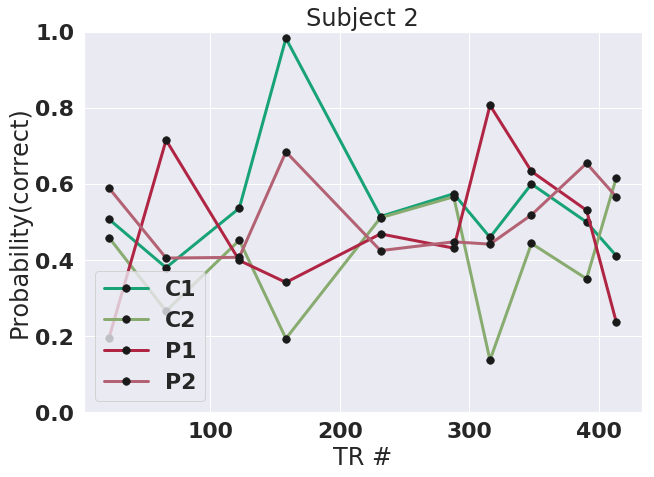

In [52]:
# CHANGED 3/14: updated stations
stationsDict = np.load('/jukebox/norman/amennen/prettymouth_fmriprep2/code/mega_testing_stations2.npy').item()
#good_stations = np.array([0,2,5,7,9,12,15,33,39,56]) # these are the good indices to test
# changed 3/20: updated stations
good_stations= np.array([0,2,5,7,9,12,15,17,20,21])
nRuns = 4
nStations = len(good_stations)
nTRs = run_TRs
correct_prob = np.zeros((nStations,nRuns,nSub))
# load spatiotemporal pattern and test for each separate station
runOrder = {}
runOrder[0] = ['P', 'P', 'C']
runOrder[1] = ['C', 'C', 'P', 'P']
for s in np.arange(nSub):
    subjectNumber = allSubjects[s]
    print(subjectNumber)
    if subjectNumber == 101:
        nRuns = 3
    else:
        nRuns = 4
    for r in np.arange(nRuns):
        for st in np.arange(nStations):
            stationInd = good_stations[st]
            filename = offline_path + '/' + 'MEGA2_stationInd_' + str(stationInd) + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg)  + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2)  + '.sav'
            #filename = offline_path + '/' + 'stationInd_' + str(stationInd) + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg)  + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2)  + '.sav'
        
            loaded_model = pickle.load(open(filename, 'rb'))
            # test whole spatiotemporal pattern
            this_station_TRs = np.array(stationsDict[stationInd])
            n_station_TRs = len(this_station_TRs)
            
            print(this_station_TRs)
            print('***')
            testing_data = allData[:,this_station_TRs,r,s]
            testing_data_reshaped = np.reshape(testing_data,(1,nVoxels*n_station_TRs))
            cheating_probability = loaded_model.predict_proba(testing_data_reshaped)[0][1]
            if runOrder[s][r] == 'C':
                correct_prob[st,r,s] = cheating_probability
            elif runOrder[s][r] == 'P':
                correct_prob[st,r,s] = 1 - cheating_probability
        print(r,s)


# next: make a different version with spatiotemporal stations!!

stationsDict
m_tr_station = np.zeros((nStations,))
for i in np.arange(nStations):
    st = good_stations[i]
    m_tr_station[i] = np.mean(stationsDict[st])

sns.set(style="white")
sns.set(font_scale=2)
plt.figure(figsize=(10,7))
g1 = '#18a377'
g2 = '#88ab6f'
p1 = '#b02543'
p2 = '#b36274'
colors = [p1, p2, g1]
plt.plot(figsize=(10,7))
for r in np.arange(3):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,0],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('P1', 'P2', 'C1', 'ERR'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 1')
plt.ylim([0,1])

plt.figure(figsize=(10,7))
colors = [g1, g2, p1, p2]
plt.plot(figsize=(10,7))
for r in np.arange(4):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,1],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('C1', 'C2', 'P1', 'P2'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 2')
plt.ylim([0,1])

print(np.mean(correct_prob[:,0:3,0]))
print(np.mean(correct_prob[:,:,1]))

101
[20 21 22 23 24]
***
[64 65 66 67 68]
***
[121 122 123 124]
***
[147 148 149 150 151 152 153 154 155]
***
[230 231 232 233]
***
[285 286 287 288 289 290 291]
***
[315 316 317]
***
[341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356]
***
[380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401]
***
0 0
[20 21 22 23 24]
***
[64 65 66 67 68]
***
[121 122 123 124]
***
[147 148 149 150 151 152 153 154 155]
***
[230 231 232 233]
***
[285 286 287 288 289 290 291]
***
[315 316 317]
***
[341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356]
***
[380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401]
***
1 0
[20 21 22 23 24]
***
[64 65 66 67 68]
***
[121 122 123 124]
***
[147 148 149 150 151 152 153 154 155]
***
[230 231 232 233]
***
[285 286 287 288 289 290 291]
***
[315 316 317]
***
[341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356]
***
[380 381 382 383 384 385 386 387 388 389 390 391

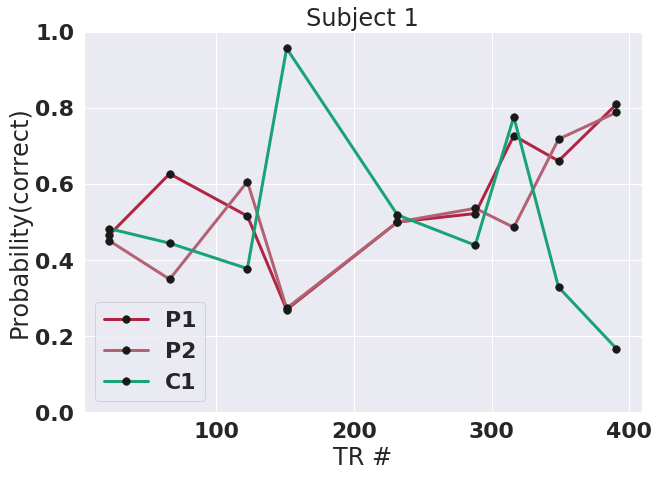

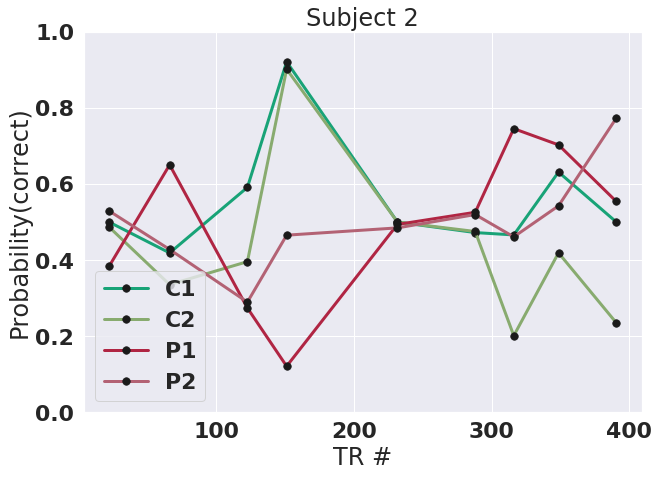

In [9]:
# now plot by run - make data matrix into one thing
# USE COMBINED STATIONS from 3/20
# load station information
# THIS IS DOING IT THE ORIGINAL WAY FROM THE FIRST STATIONS BUT I DON'T KNOW WHY I ADDED THE LAST COUPLE OF STATIONS!
stationsDict = np.load('/jukebox/norman/amennen/prettymouth_fmriprep2/code/combined_stations.npy').item()
nStations = len(stationsDict)
nTRs = run_TRs
nRuns = 4
correct_prob = np.zeros((nStations,nRuns,nSub))
# load spatiotemporal pattern and test for each separate station
runOrder = {}
runOrder[0] = ['P', 'P', 'C']
runOrder[1] = ['C', 'C', 'P', 'P']
for s in np.arange(nSub):
    subjectNumber = allSubjects[s]
    print(subjectNumber)
    if subjectNumber == 101:
        nRuns = 3
    else:
        nRuns = 4
    for r in np.arange(nRuns):
        for st in np.arange(nStations):
            stationInd = st
            filename = offline_path + '/' + 'COMBINED_stationInd_' + str(stationInd) + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg)  + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2)  + '.sav'

            loaded_model = pickle.load(open(filename, 'rb'))
            # test whole spatiotemporal pattern
            this_station_TRs = np.array(stationsDict[stationInd])
            print(this_station_TRs)
            print('***')
            n_station_TRs = len(this_station_TRs)
            testing_data = allData[:,this_station_TRs,r,s]
            testing_data_reshaped = np.reshape(testing_data,(1,nVoxels*n_station_TRs))
            cheating_probability = loaded_model.predict_proba(testing_data_reshaped)[0][1]
            if runOrder[s][r] == 'C':
                correct_prob[st,r,s] = cheating_probability
            elif runOrder[s][r] == 'P':
                correct_prob[st,r,s] = 1 - cheating_probability
        print(r,s)




stationsDict
m_tr_station = np.zeros((nStations,))
for i in np.arange(nStations):
    st = i
    m_tr_station[i] = np.mean(stationsDict[st])

sns.set(style="white")
sns.set(font_scale=2)
plt.figure(figsize=(10,7))
g1 = '#18a377'
g2 = '#88ab6f'
p1 = '#b02543'
p2 = '#b36274'
colors = [p1, p2, g1]
plt.plot(figsize=(10,7))
for r in np.arange(3):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,0],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('P1', 'P2', 'C1', 'ERR'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 1')
plt.ylim([0,1])

plt.figure(figsize=(10,7))
colors = [g1, g2, p1, p2]
plt.plot(figsize=(10,7))
for r in np.arange(4):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,1],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('C1', 'C2', 'P1', 'P2'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 2')
plt.ylim([0,1])

#np.mean(cheating_prob[:,0:2,0])
print(np.mean(correct_prob[:,0:3,0]))
print(np.mean(correct_prob[:,:,1]))

In [24]:
m_tr_station[st]

IndexError: index 21 is out of bounds for axis 0 with size 10

(0, 1)

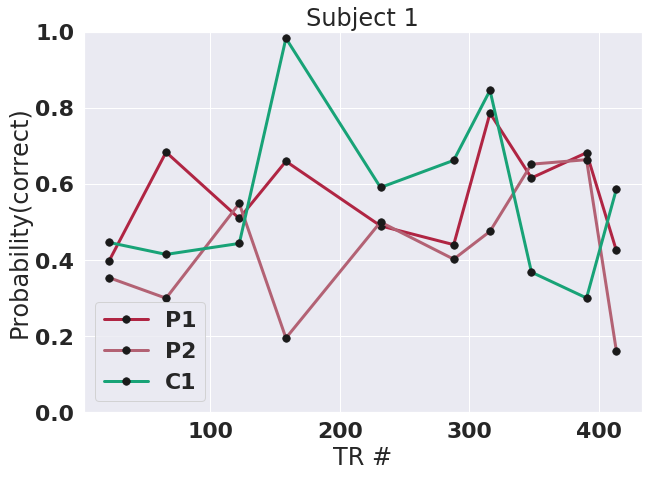

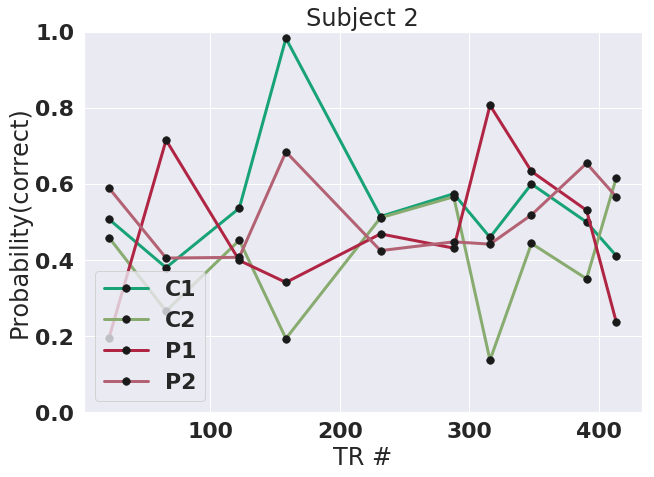

In [25]:

stationsDict
m_tr_station = np.zeros((nStations,))
for i in np.arange(nStations):
    st = good_stations[i]
    m_tr_station[i] = np.mean(stationsDict[st])

sns.set(style="white")
sns.set(font_scale=2)
plt.figure(figsize=(10,7))
g1 = '#18a377'
g2 = '#88ab6f'
p1 = '#b02543'
p2 = '#b36274'
colors = [p1, p2, g1]
plt.plot(figsize=(10,7))
for r in np.arange(3):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,0],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('P1', 'P2', 'C1', 'ERR'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 1')
plt.ylim([0,1])

plt.figure(figsize=(10,7))
colors = [g1, g2, p1, p2]
plt.plot(figsize=(10,7))
for r in np.arange(4):
    sns.lineplot(x=m_tr_station,y=correct_prob[:,r,1],lw=3,color=colors[r],marker=".",markerSize=15,mec='k',mfc='k')
plt.legend(('C1', 'C2', 'P1', 'P2'),loc=3)
plt.xlabel('TR #')
plt.ylabel('Probability(correct)')
plt.title('Subject 2')
plt.ylim([0,1])

#np.mean(cheating_prob[:,0:2,0])


In [15]:
np.mean(correct_prob,axis=0)

array([[0.54539721, 0.52957804],
       [0.45469661, 0.40770948],
       [0.55156902, 0.49336492],
       [0.        , 0.49595289]])

In [26]:
print(np.mean(cheating_prob[:,0:2,0]))
print(np.mean(cheating_prob[:,2,0]))

print(np.mean(cheating_prob[:,0:2,1]))
print(np.mean(cheating_prob[:,2:4,1]))

0.4274768568859157
0.6031884709340714
0.5541377826066779
0.45955341690613316


In [6]:
# look at just time course of data to see how they go from one run to the next
# (mask dependent)

# see if for subject 102, within context > diff context
s = 0
P1 = allData[:,:,0,s].flatten()
P2 = allData[:,:,1,s].flatten()
C1 = allData[:,:,2,s].flatten()

# or just do spatiotemporal correlation
z1 = np.corrcoef(P1,P2)[0,1]
print('P1 - P2 %4.4f' % z1)
z1 = np.corrcoef(C1,P2)[0,1]
print('C1 - P2 %4.4f' % z1)
z1 = np.corrcoef(C1,P1)[0,1]
print('C1 - P1 %4.4f' % z1)

# break it up into same - same, and diff - dif
same = np.zeros((nSub,2))
diff_far = np.zeros((nSub,2))
diff_close = np.zeros((nSub))


same[s,0] = np.corrcoef(P1,P2)[0,1]
diff_far[s,0] = np.corrcoef(C1,P1)[0,1]
diff_close[s] = np.corrcoef(P2,C1)[0,1]

P1 - P2 0.0787
C1 - P2 0.0535
C1 - P1 0.0818


In [7]:
s = 1
RUN_ORDER = ['C', 'C', 'P', 'P']
P1 = allData[:,:,2,s].flatten()
P2 = allData[:,:,3,s].flatten()
C1 = allData[:,:,0,s].flatten()
C2 = allData[:,:,1,s].flatten()
# or just do spatiotemporal correlation
r01 = np.corrcoef(C1,C2)[0,1]
print('C1 - C2 %4.4f' % r01)
r12 = np.corrcoef(C2,P1)[0,1]
print('C2 - P1 %4.4f' % r12)
r23 = np.corrcoef(P1,P2)[0,1] # run2,3
print('P1 - P2 %4.4f' % r23)

r03 = np.corrcoef(C1,P2)[0,1]
print('C1 - P2 %4.4f' % r03)
r02 = np.corrcoef(C1,P1)[0,1]
print('C1 - P1 %4.4f' % r02)
r13 = np.corrcoef(C2,P2)[0,1]
print('C2 - P2 %4.4f' % r13)

same[s,0] = np.corrcoef(P1,P2)[0,1]
diff_far[s,0] = np.corrcoef(C1,P1)[0,1]
diff_close[s] = np.corrcoef(P1,C2)[0,1]

same[s,1] = np.corrcoef(C1,C2)[0,1]
diff_far[s,1] = np.corrcoef(C2,P2)[0,1]

C1 - C2 0.0732
C2 - P1 0.0514
P1 - P2 0.0568
C1 - P2 0.0484
C1 - P1 0.0506
C2 - P2 0.0590


DEBUG:2019-03-05 11:39:38,445 - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=bold:stretch=normal:size=10.0 to DejaVu Sans ('/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans-Bold.ttf') with score of 0.000000


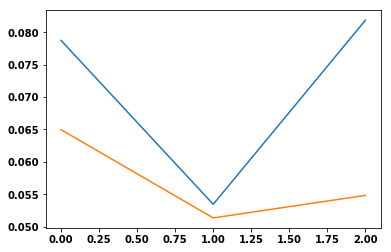

In [8]:
np.mean(same)
s=0
z = np.array([same[s,0], diff_close[s], diff_far[s,0]])
plt.plot(z)

s=1
z = np.array([np.mean(same,axis=1)[s], diff_close[s], np.mean(diff_far,axis=1)[s]])
plt.plot(z)

In [16]:
# now go through and test each subject
nRuns = 4
if classifierType == 1:
    cheating_prob = np.zeros((run_TRs,nRuns,nSub))
else:
    cheating_prob = np.zeros((nRuns,nSub))
nTRs = run_TRs
if constant_classifier: # just load one classifier for all TRs
    filename = offline_path + '/' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '_TRconstant_' + str(TR_to_use) + '.sav'
    loaded_model = pickle.load(open(filename,'rb'))
for s in np.arange(nSub):
    subjectNumber = allSubjects[s]
    print(subjectNumber)
    if subjectNumber == 101:
        nRuns = 3
    else:
        nRuns = 4
    for r in np.arange(nRuns):
        if classifierType == 1:
            for t in np.arange(nTRs):
                if not constant_classifier: # load unique TR classifier
                    filename = offline_path + '/' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '_TR_' + str(t) + '.sav'
                    loaded_model = pickle.load(open(filename, 'rb'))
                thisData = allData[:,t,r,s]
                cheating_prob[t,r,s] = loaded_model.predict_proba(thisData.reshape(1,-1))[0][0]
        else:
            filename = offline_path + '/' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType)  + '_k1_' + str(k1) + '_k2_' + str(k2)  + '.sav'
            loaded_model = pickle.load(open(filename, 'rb'))
            # test whole spatiotemporal pattern
            testing_data_tp = allData[:,:,r,s].T
            testing_data = testing_data_tp.flatten()
            cheating_prob[r,s] = loaded_model.predict_proba(testing_data.reshape(1,-1))[0][0]
        print(r,s)

101
0 0
1 0
2 0
102
0 1
1 1
2 1
3 1


In [17]:
cheating_prob
np.mean(cheating_prob,axis=0)

array([[0.48659126, 0.48015614],
       [0.53855289, 0.50569263],
       [0.49017562, 0.53154225],
       [0.        , 0.47291015]])

In [88]:
np.mean(cheating_prob,axis=0)

array([[0.53863411, 0.54517508],
       [0.53120659, 0.61085333],
       [0.53741354, 0.53467699],
       [0.        , 0.54248799]])

In [72]:
# calculate cheating probability from best time points found in fmriprep2/code/make_stations
final_good = np.load('/jukebox/norman/amennen/prettymouth_fmriprep2/code/final_good_pts.npy')
good_TR_prob = cheating_prob[final_good,:,:]
np.mean(good_TR_prob,axis=0)

array([[0.57811387, 0.5800205 ],
       [0.61529457, 0.60556838],
       [0.54507095, 0.5717117 ],
       [0.        , 0.58926295]])

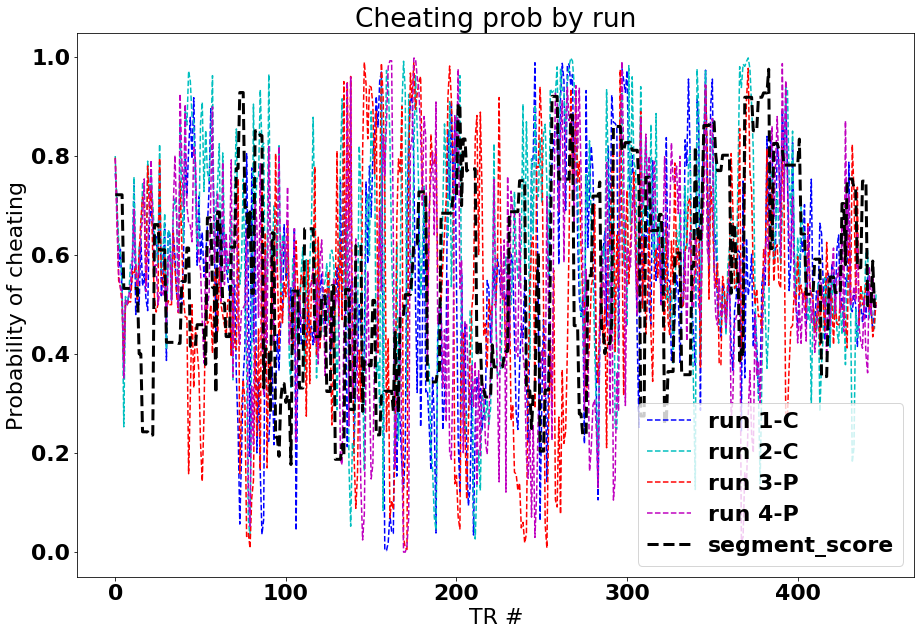

In [19]:
plt.figure(figsize=(15,10))
if subjectNum == 101:
    subject_COND = ['P', 'P', 'C']

if subjectNum == 102:
    subject_COND = ['C', 'C', 'P', 'P']
colors = ['b', 'c', 'r', 'm']
segment_score_vector = np.load(fmriprep2_path + '/' + 'segment_score_vector.npy')

for r in np.arange(nRuns):
    this_run = r + 1
    label = 'run %i-%s' % (this_run,subject_COND[r])
    plt.plot(cheating_prob[3:,r,s], '--', color=colors[r],label=label)
plt.plot(segment_score_vector[0:-3]/10 + np.mean(cheating_prob), '--', color='k', label='segment_score',linewidth=3)

plt.legend()
plt.xlabel('TR #')
plt.ylabel('Probability of cheating')
plt.title('Cheating prob by run')
avg_by_run = np.mean(cheating_prob,axis=0)


Text(0.5,1,'Average signal data')

DEBUG:2019-03-04 11:59:15,256 - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=bold:stretch=normal:size=22.0 to DejaVu Sans ('/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans-Bold.ttf') with score of 0.000000
DEBUG:2019-03-04 11:59:15,264 - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=22.0 to DejaVu Sans ('/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000
DEBUG:2019-03-04 11:59:15,441 - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=26.4 to DejaVu Sans ('/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000


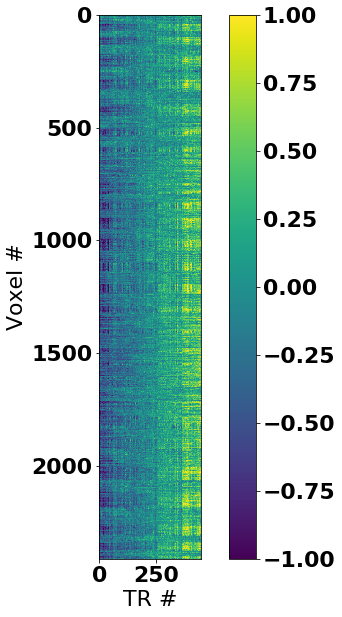

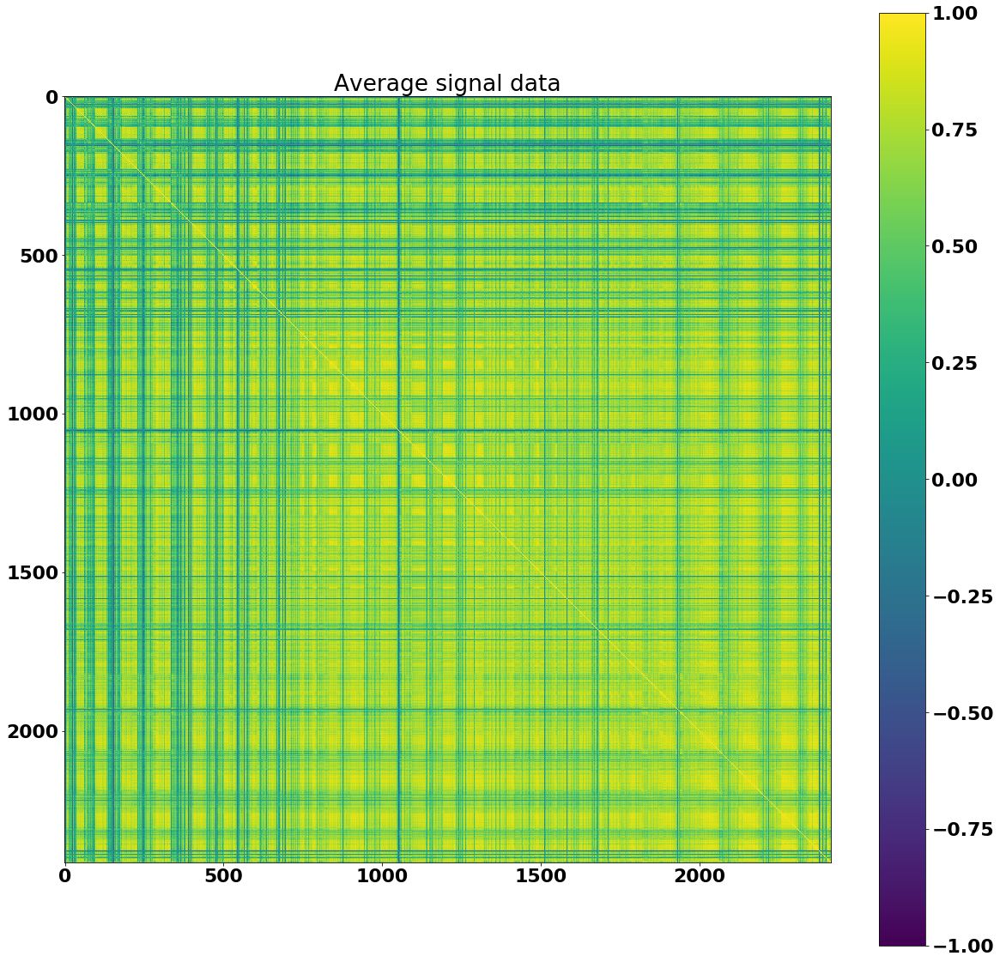

In [12]:
plt.figure(figsize=(10,10))
plt.imshow(average_signal)
plt.colorbar()
plt.clim(-1,1)
plt.xlabel('TR #')
plt.ylabel('Voxel #')


z1 = np.corrcoef(average_signal)
np.shape(z1)
plt.figure(figsize=(20,20))
plt.imshow(z1)
plt.clim(-1,1)
plt.colorbar()
plt.title('Average signal data')


Text(0,0.5,'Average voxel activity')

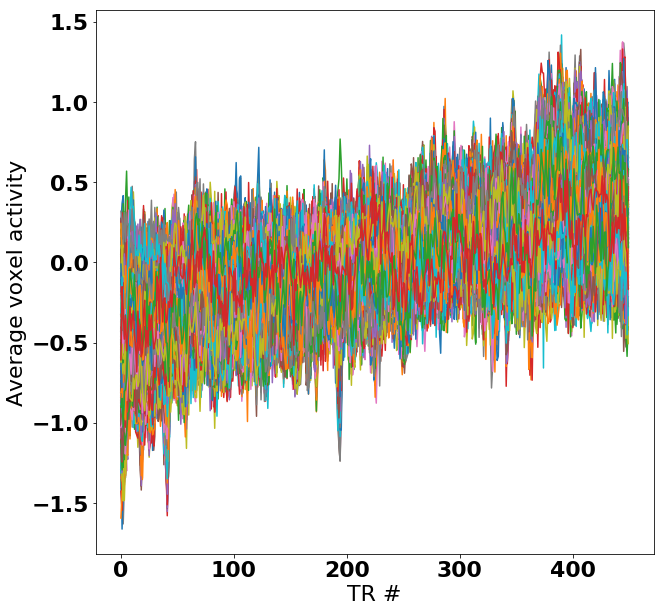

In [13]:
vox = range(700,2414)
plt.figure(figsize=(10,10))
for v in vox:
    plt.plot(average_signal[v,:])
plt.xlabel('TR #')
plt.ylabel('Average voxel activity')

/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/numpy/lib/function_base.py:3183: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/numpy/lib/function_base.py:3184: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Text(0.5,1,'Average training signal removed data')

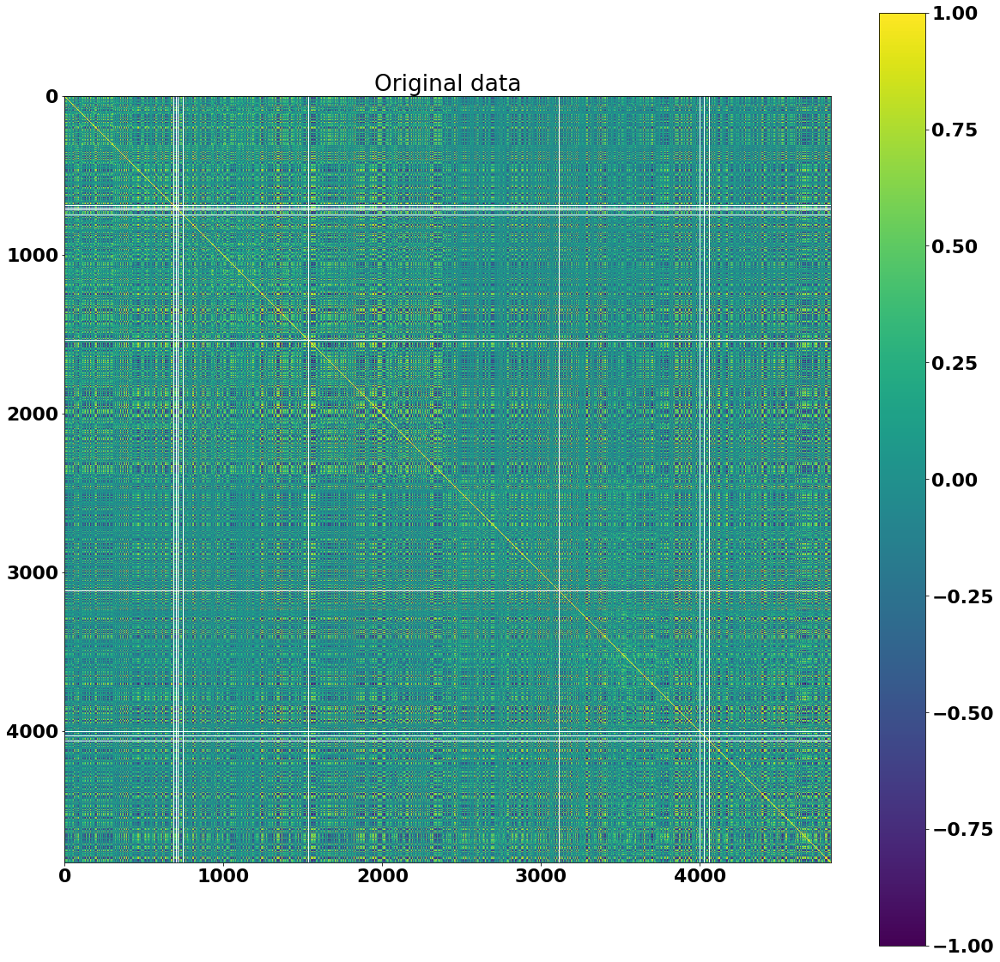

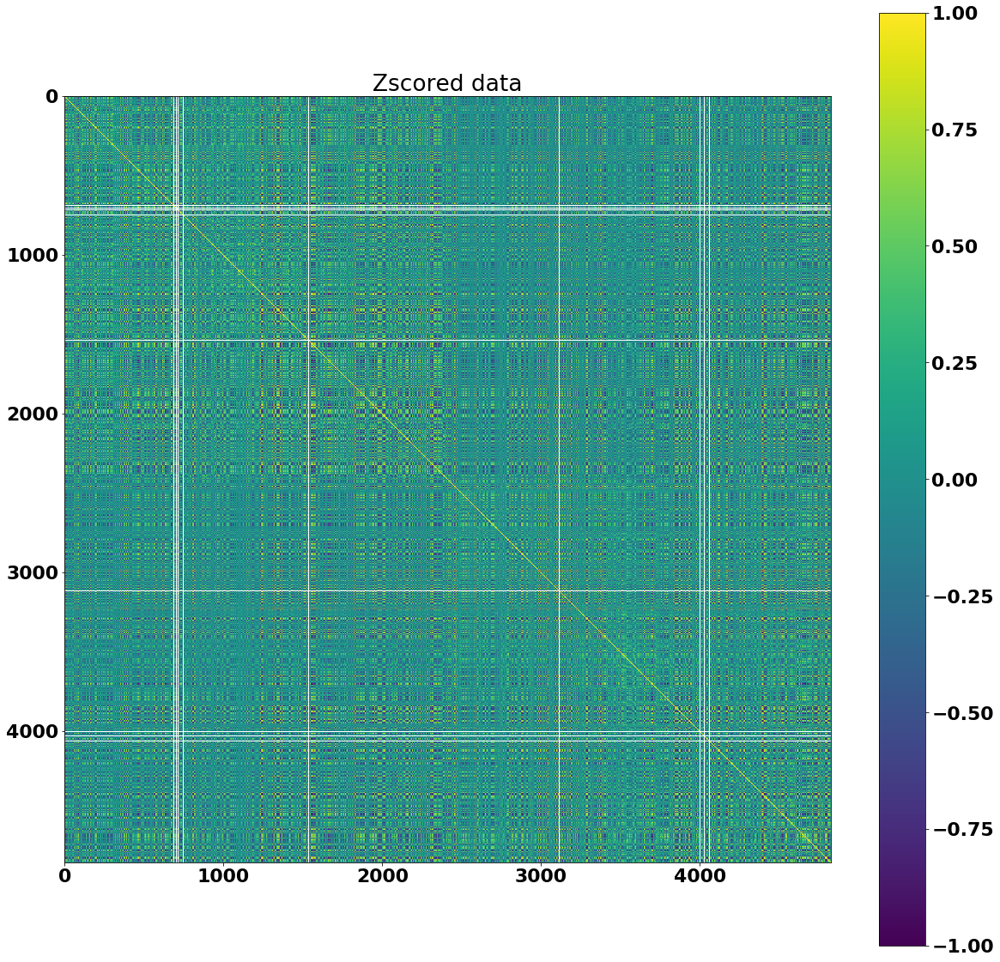

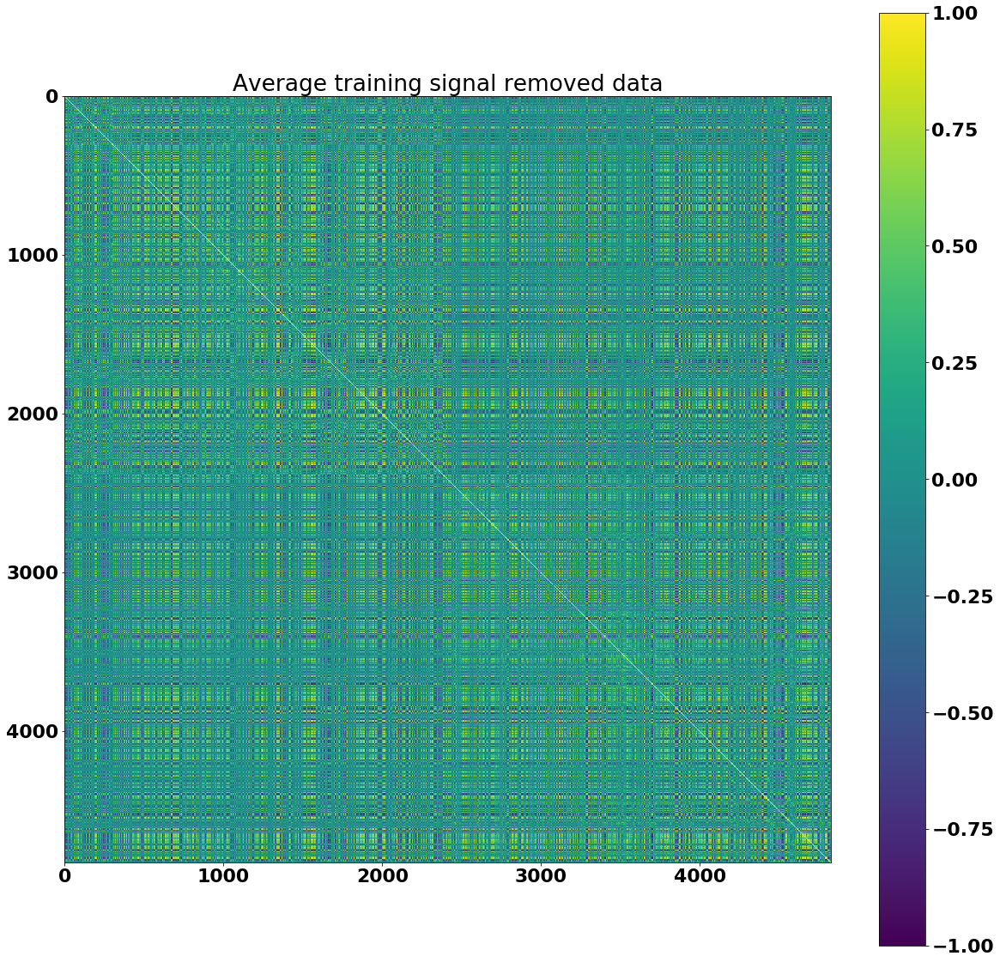

In [16]:
z1 = np.corrcoef(originalData_all[:,:,2,1],originalData_all[:,:,0,1])
np.shape(z1)
plt.figure(figsize=(20,20))
plt.imshow(z1)
plt.clim(-1,1)
plt.colorbar()
plt.title('Original data')

z = np.corrcoef(zscoredData_all[:,:,2,1],zscoredData_all[:,:,0,1])
np.shape(z)
plt.figure(figsize=(20,20))
plt.imshow(z)
plt.clim(-1,1)

plt.colorbar()
plt.title('Zscored data')

z = np.corrcoef(removedAvgData_all[:,:,2,1],removedAvgData_all[:,:,0,1])
np.shape(z)
plt.figure(figsize=(20,20))
plt.imshow(z)
plt.clim(-1,1)

plt.colorbar()
plt.title('Average training signal removed data')


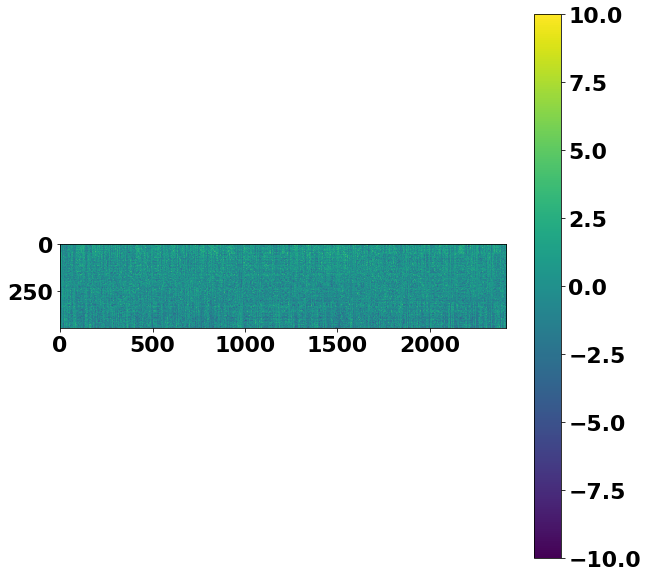

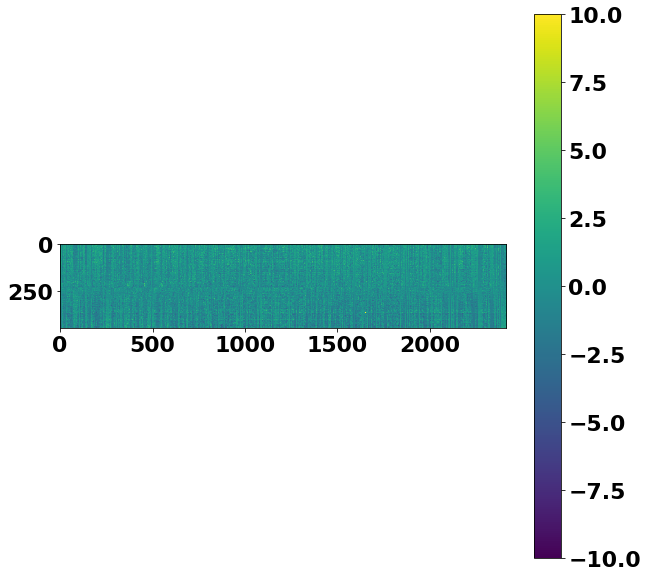

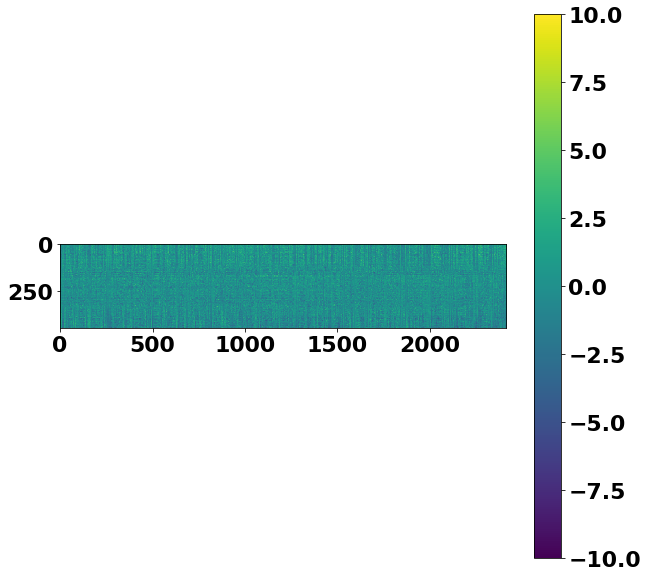

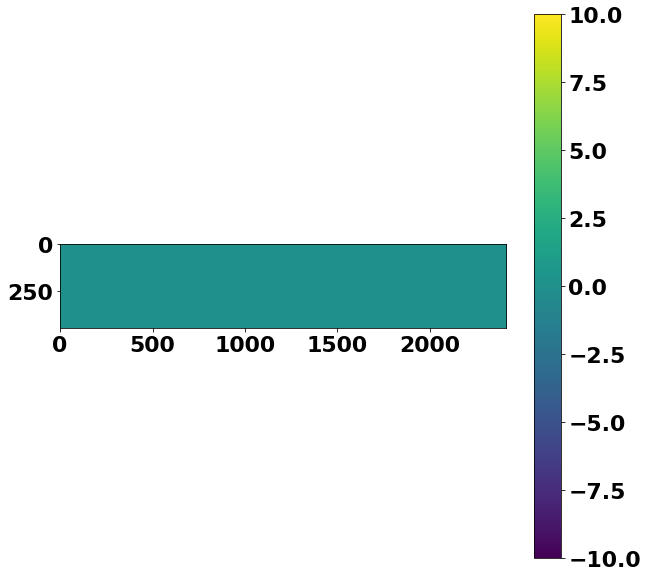

In [15]:
# now check with properties of subject



s=0
for r in np.arange(nRuns):
    plt.figure(figsize=(10,10))
    plt.imshow(removedAvgData_all[:,:,r,s].T)
    plt.colorbar()
    plt.clim(-10,10)

In [22]:
avg_by_run

array([[0.53863411, 0.54517508],
       [0.53120659, 0.61085333],
       [0.53741354, 0.53467699],
       [0.51231901, 0.54248799]])

In [23]:
for r in np.arange(nRuns):
    [corr,p] = scipy.stats.pearsonr(cheating_prob[3:,r,s],segment_score_vector[0:-3])
    mean_seg_max = np.mean(cheating_prob[378:409,r])
    print('RUN %i correlation between ratings and cheating prob: %2.2f (p=%3.3f)' % (r,corr,p))
    print('RUN %i mean cheating prob: %2.2f' % (r,avg_by_run[r,s]))
    print(mean_seg_max)


RUN 0 correlation between ratings and cheating prob: 0.14 (p=0.003)
RUN 0 mean cheating prob: 0.55
0.6483626225270717
RUN 1 correlation between ratings and cheating prob: 0.14 (p=0.003)
RUN 1 mean cheating prob: 0.61
0.6060854290677277
RUN 2 correlation between ratings and cheating prob: -0.09 (p=0.064)
RUN 2 mean cheating prob: 0.53
0.5716074760281961
RUN 3 correlation between ratings and cheating prob: 0.08 (p=0.102)
RUN 3 mean cheating prob: 0.54
0.5358698843631101


In [44]:
cheating_prob = np.zeros((run_TRs,nRuns))
for r in np.arange(nRuns):
    subjectRun = r + 1
    run_id = 'run-{0:02d}'.format(subjectRun)
    subjData = data_dir + '/' + bids_id + '_' + ses_id + '_' + 'task-story' + '_' + run_id + '_' + 'space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz'
    print(subjData)
    if maskType == 0:
        masked_data = apply_mask(subjData,DMNmask)
    elif maskType == 1:
        masked_data = apply_mask(subjData,TOM_large)
    elif maskType == 2:
        masked_data = apply_mask(subjData,TOM_cluster)
    masked_data_remove10 = masked_data[10:,:]
    
        # A. get story TRs ONLY
    original_data = masked_data_remove10[story_TR_1:story_TR_2,:].T # now should be voxels x TR
    # B. zscore within that subject across all time points
    if zscore_data:
        original_data = stats.zscore(original_data,axis=1,ddof = 1)
        original_data = np.nan_to_num(original_data)
    
    # C. remove average signal
    if removeAvg:
        average_signal_fn = offline_path + '/' +  'averageSignal' + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '.npy'
        average_signal = np.load(average_signal_fn)
        #average_signal = 0
        SRM_removed = original_data - average_signal
    else:
        SRM_removed = original_data
    #allData[:,:,r] = SRM_removed
    # D. classify - want probability for every time point
    #nTRs = np.shape(average_signal)[1]
    nTRs = run_TRs
    # load classifier
    if constant_classifier:
        filename = offline_path + '/' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '_TRconstant_' + str(TR_to_use) + '.sav'
        loaded_model = pickle.load(open(filename,'rb'))
    for t in np.arange(nTRs):
        if not constant_classifier:
            filename = offline_path + '/' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '_TR_' + str(t) + '.sav'
            loaded_model = pickle.load(open(filename, 'rb'))
        cheating_prob[t,r] = loaded_model.predict_proba(SRM_removed[:,t].reshape(1,-1))[0][0]

/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-101/ses-01/func/sub-101_ses-01_task-story_run-01_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-101/ses-01/func/sub-101_ses-01_task-story_run-02_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


/jukebox/norman/amennen/RT_prettymouth/data/bids/Norman/Mennen/5516_greenEyes//derivatives/fmriprep/sub-101/ses-01/func/sub-101_ses-01_task-story_run-03_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


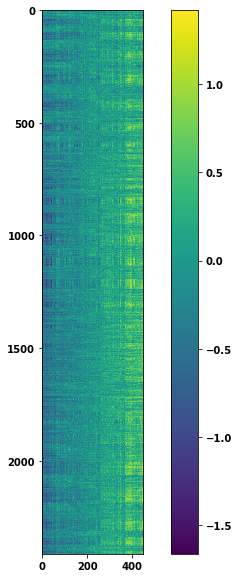

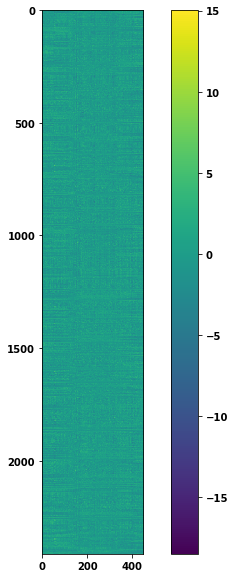

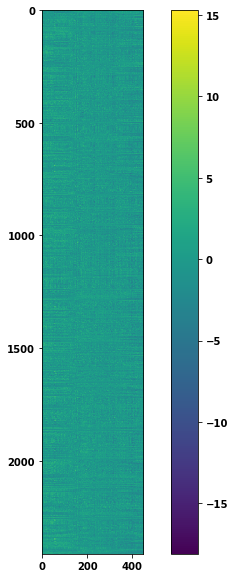

In [55]:
# to do: look more at the original data for everyone, zscored data for everyone, SRM removed for everyone***
np.shape(average_signal)
plt.figure(figsize=(10,10))
plt.imshow(average_signal)
plt.colorbar()

np.shape(average_signal)
plt.figure(figsize=(10,10))
plt.imshow(original_data)
plt.colorbar()

np.shape(average_signal)
plt.figure(figsize=(10,10))
plt.imshow(SRM_removed)
plt.colorbar()

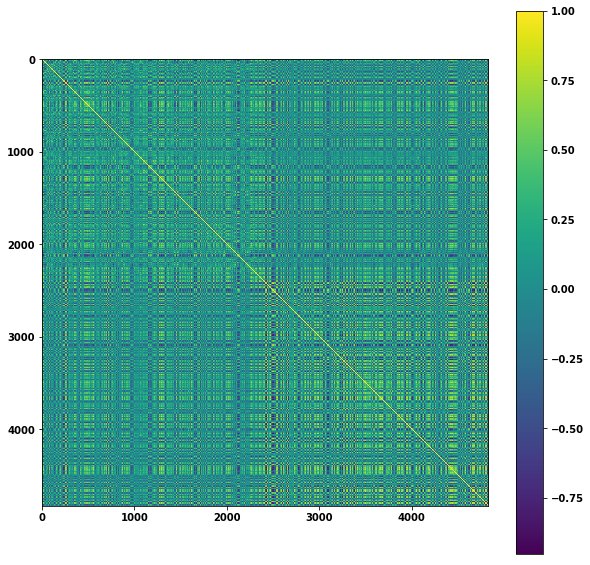

In [45]:
z = np.corrcoef(allData[:,:,2,0],allData[:,:,1,0])
np.shape(z)
plt.figure(figsize=(10,10))
plt.imshow(z)
plt.colorbar()

In [12]:
# plot time points
cheating_prob[0:5,:]

array([[0.61437936, 0.65190552, 0.66660309],
       [0.58852254, 0.65087499, 0.67018609],
       [0.74856724, 0.77742363, 0.68983175],
       [0.58189844, 0.6252686 , 0.70439896],
       [0.71002283, 0.67689022, 0.7449271 ]])

In [13]:
avg_by_run

array([0.53863411, 0.53120659, 0.53741354])

In [78]:
# A. get story TRs ONLY
original_data = masked_data_remove10[story_TR_1:story_TR_2,:].T # now should be voxels x TR
# B. zscore within that subject across all time points
original_data = stats.zscore(original_data,axis=1,ddof = 1)
original_data = np.nan_to_num(original_data)
# C. remove average signal
if removeAvg:
    average_signal_fn = offline_path + '/' +  'averageSignal' + '_' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '.npy'
    average_signal = np.load(average_signal_fn)
    SRM_removed = original_data - average_signal
else:
    SRM_removed = original_data

# D. classify - want probability for every time point
nTRs = np.shape(average_signal)[1]
cheating_prob = np.zeros((nTRs,))
# load classifier
for t in np.arange(nTRs):
    filename = offline_path + '/' + 'ROI_' + str(maskType) + '_AVGREMOVE_' + str(removeAvg) + '_classifierType_' + str(classifierType) + '_filter_' + str(filterType) + '_k1_' + str(k1) + '_k2_' + str(k2) + '_TR_' + str(t) + '.sav'
    loaded_model = pickle.load(open(filename, 'rb'))
    cheating_prob[t] = loaded_model.predict_proba(SRM_removed[:,t].reshape(1,-1))[0][0]
# first index is paranoid, second index is cheating

/jukebox/pkgs/PYGER/beta/lib/python3.6/site-packages/scipy/stats/stats.py:2246: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


In [82]:
np.shape(cheating_prob)

(450,)

In [64]:
np.mean(cheating_prob)

0.5253812168525659